# Exploratory Data Exploration (EDA)

> This noteboook aims to understand the general conformation of the data, this is, just an exploration of the dataset.

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy
import cv2
import os

BASE_DATA_DIR = os.path.join('data', 'train')

First we check the files available inside the `train` folder:

In [11]:
# get the file extensions
file_exts = set( [ fil.split('.')[-1] for fil in os.listdir( BASE_DATA_DIR )])
file_exts

{'csv', 'jpeg', 'png'}

Check the number of files for each extension:

In [12]:
image_filenames = list( filter(lambda x: x.split('.')[-1] in ['jpeg', 'png'], os.listdir( BASE_DATA_DIR )) )
print("Number of image files:", len(image_filenames) )

csv_filenames = list( filter(lambda x: x.split('.')[-1] in ['csv'], os.listdir( BASE_DATA_DIR )) )
print("Files .csv:", csv_filenames )

Number of image files: 15470
Files .csv: ['labels_train.csv']


We will define some helper functions too:

In [26]:
equalisator = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(5,5))

def read_image( img_name, size=(256, 256) ):
    """
    (1) We read the image in grayscale and resize it if wanted.
    (2) Normalise range to [0, 255] 
    (3) We apply histogram equalisation ( improves details quality )
    """
    img_path = os.path.join( BASE_DATA_DIR, img_name )
    img = cv2.imread( img_path, cv2.IMREAD_GRAYSCALE )
    if ( size is not None ):
        img = cv2.resize( img, size )
        
    # normalisation and eqauliser
    img = cv2.normalize(img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    img = equalisator.apply( img )
    return img


def read_image_2( img_name, size=(256, 256) ):
    """
    (1) We read the image in grayscale and resize it if wanted.
    (2) Normalise range to [0, 255] 
    (3) We apply histogram equalisation ( improves details quality )
    """
    img_path = os.path.join( BASE_DATA_DIR, img_name )
    img = cv2.imread( img_path, cv2.IMREAD_GRAYSCALE )
    if ( size is not None ):
        img = cv2.resize( img, size )
        
    # normalisation and eqauliser
    img = cv2.normalize(img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    # img = equalisator.apply( img )
    return img

# 1. Analysing images:

We start by visualising the images, here the idea is just to provided and exploration.

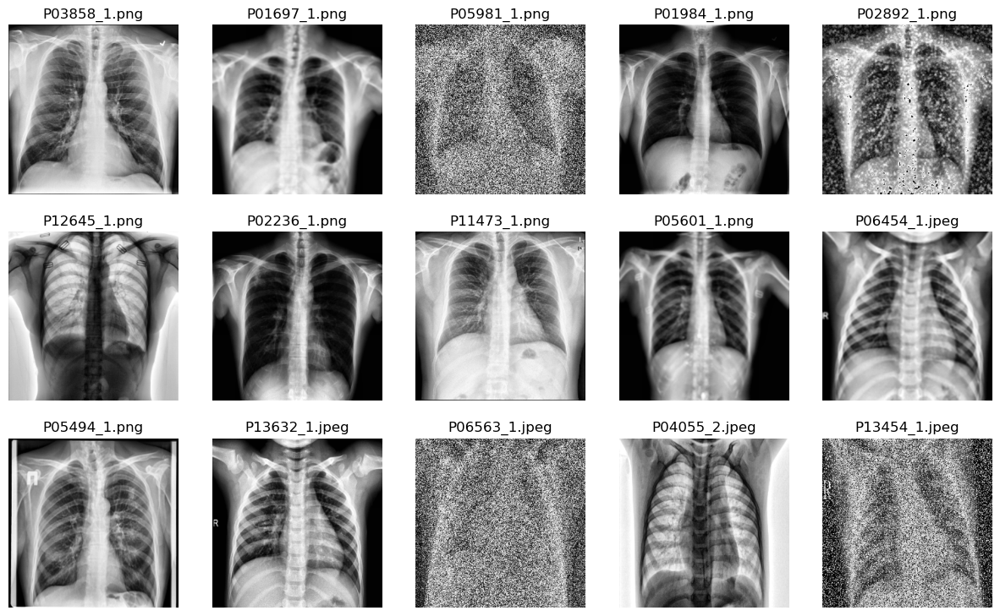

In [14]:
SAMPLE_SIZE = 5
rows = 3

fig, ax = plt.subplots(rows, SAMPLE_SIZE, figsize=(3 * SAMPLE_SIZE, 3 * rows))
image_file_examples = np.random.choice(image_filenames, size=SAMPLE_SIZE * rows)
for idx, img_name in enumerate(image_file_examples):
    i, j = idx % SAMPLE_SIZE, idx // SAMPLE_SIZE
    img = read_image( img_name, size=(256, 256))
    ax[j, i].imshow( img, cmap='gray' ), ax[j, i].axis('off')
    ax[j, i].set_title(img_name)
    
plt.show()

The images show that apart from "normal" images, we have others with `perturbations`. The idea of the following sections will be to try to understand them and explore solutions on how to overcome them (if necessary). In general, we can define three different types:

- Negative ( inversed image ).
- Noisy image ( different degrees ).
- Blurred image.

It is relevant to understand how we define a **_normal image_** for the task:

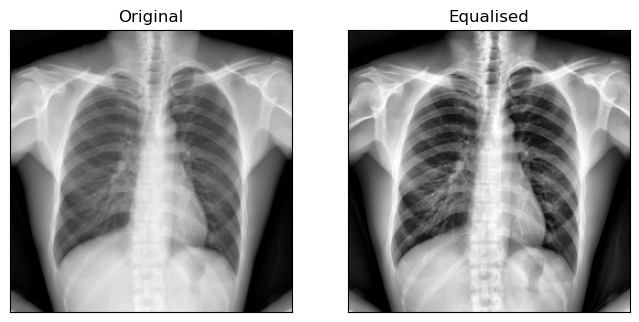

In [32]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
img_normal = read_image_2( 'P03357_1.png', size=(256, 256) )
img = read_image( 'P03357_1.png', size=(256, 256) )
ax[0].imshow( img_normal, cmap='gray'), ax[0].set_xticks([]), ax[0].set_yticks([])
ax[1].imshow( img, cmap='gray'), ax[1].set_xticks([]), ax[1].set_yticks([])
ax[0].set_title(f"Original")
ax[1].set_title(f"Equalised")
plt.show()

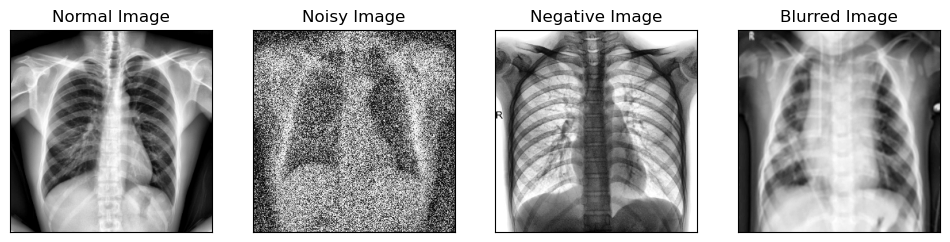

In [30]:
images_to_show = [
    ('P03357_1.png', 'Normal Image'),
    ('P01308_1.png', 'Noisy Image'),
    ('P11468_1.jpeg', 'Negative Image'),
    ('P00515_1.jpeg', 'Blurred Image')
]

fig, ax = plt.subplots(1, 4, figsize=(12, 4))
for i, (img_name, desc) in enumerate(images_to_show):
    img = read_image( img_name, size=(256, 256) )
    ax[i].imshow( img, cmap='gray'), ax[i].set_xticks([]), ax[i].set_yticks([])
    ax[i].set_title(f"{desc}")
plt.show()

## 1.1 Solving Perturbations

This sections tries to explore (1) how to detect and specific pertubations and (2) how to solve it.

In [7]:
def middle_crop( image, width=0.25, pad=0.1 ):
    """  This tries to cut the column. """
    center_x, center_y = image.shape[1] // 2, image.shape[0] // 2
    crop_w, crop_h = int( width * image.shape[1] ), int( (1 - 2 * pad) * image.shape[0] )
    crop = image[
        center_y - (crop_h // 2):center_y + (crop_h // 2),
        center_x - (crop_w // 2):center_x + (crop_w // 2)
    ]
    return crop

def bottom_center_crop( image, width=0.25, height=0.2 ):
    """ 
    We cut the center_bottom crop of the image ( a normally similar area between images <diafragma> ).
    """
    crop_w, crop_h = int( width * image.shape[1] ), int( height * image.shape[0] )
    center_x, center_y = image.shape[1] // 2, image.shape[0] - crop_h // 2
    crop = image[
        center_y - (crop_h // 2):center_y + (crop_h // 2),
        center_x - (crop_w // 2):center_x + (crop_w // 2)
    ]
    return crop

### (1) Detection:

The first idea is to visualise some random images and check basic statistics. Ideally, this will be able to reveal some relevant measurements to be used.

**Note:** the `focus` measurement is specially relevant here, the laplacian of the image identifies the fast "changes" between the edges of the images (is the second derivate). A low `focus` value will mean that there are not many noticable edges, and given so, a more blurried image.

In [8]:
def get_image_stats( image ):
    stats = { 'mean': image.mean(), 'std': image.std() }
    stats['focus'] = cv2.Laplacian(image, ddepth=cv2.CV_32F, ksize=3).var()
    return stats

def get_histogram( image ):
    return cv2.calcHist( image, channels=[0], mask=None, histSize=[128], ranges=[0, 255] )

Let's see some samples and show the statistics. Along that we are also showing the `crop` and the some other relevant images.

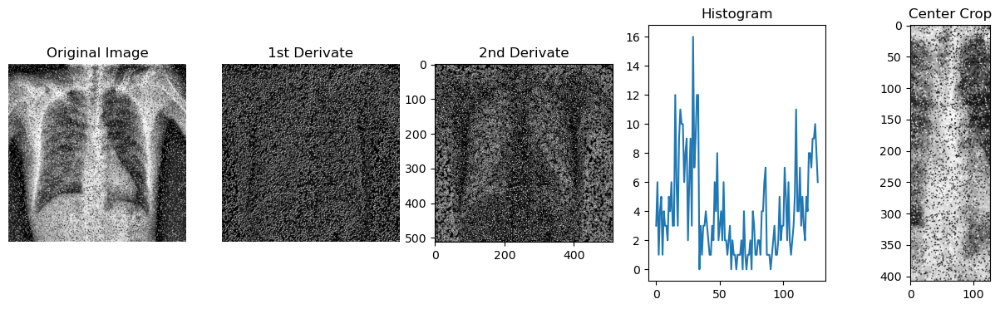

Original Description: {'mean': 121.70022964477539, 'std': 72.51223141709556, 'focus': 119272.97}
Sobel Description: {'mean': 59.56068420410156, 'std': 66.92514350415972, 'focus': 215037.16}
Laplacian Description: {'mean': 69.20370864868164, 'std': 97.323052605381, 'focus': 792193.0}
Crop Description:  {'mean': 150.42570465686273, 'std': 65.63349468452415, 'focus': 122655.0}


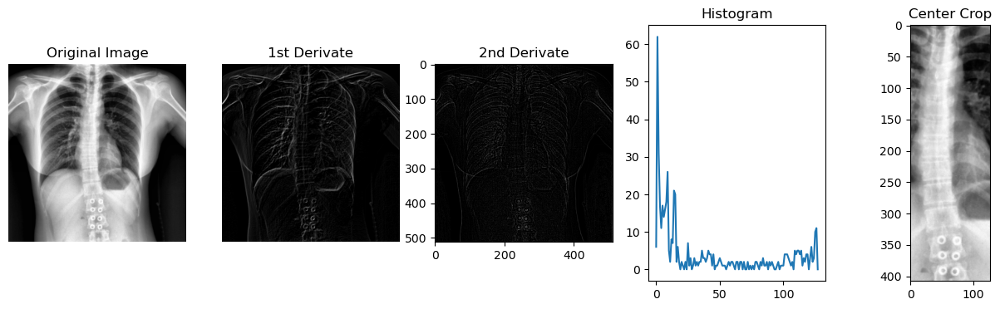

Original Description: {'mean': 116.8082389831543, 'std': 77.80256733729095, 'focus': 489.9507}
Sobel Description: {'mean': 10.735980987548828, 'std': 16.006431000046753, 'focus': 2373.949}
Laplacian Description: {'mean': 7.236991882324219, 'std': 13.30669160199789, 'focus': 11906.407}
Crop Description:  {'mean': 158.9588503370098, 'std': 63.02788718970847, 'focus': 704.1757}


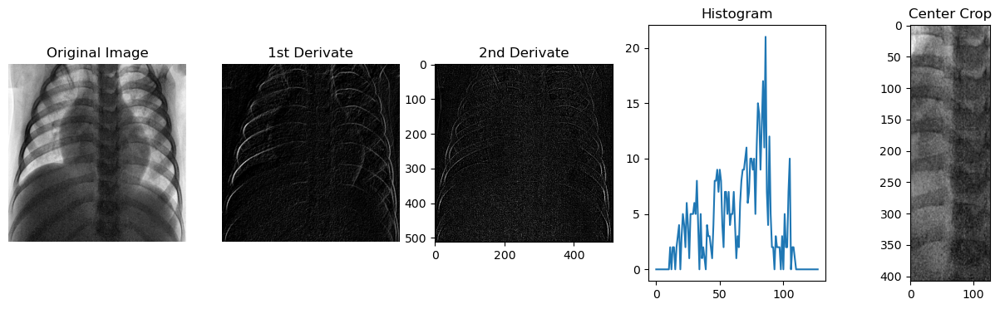

Original Description: {'mean': 97.04405212402344, 'std': 55.70750529563675, 'focus': 2565.9639}
Sobel Description: {'mean': 15.101570129394531, 'std': 20.2005886099515, 'focus': 10418.913}
Laplacian Description: {'mean': 19.05217742919922, 'std': 30.33990449855936, 'focus': 79791.28}
Crop Description:  {'mean': 56.05715762867647, 'std': 21.466104144762003, 'focus': 2947.8032}


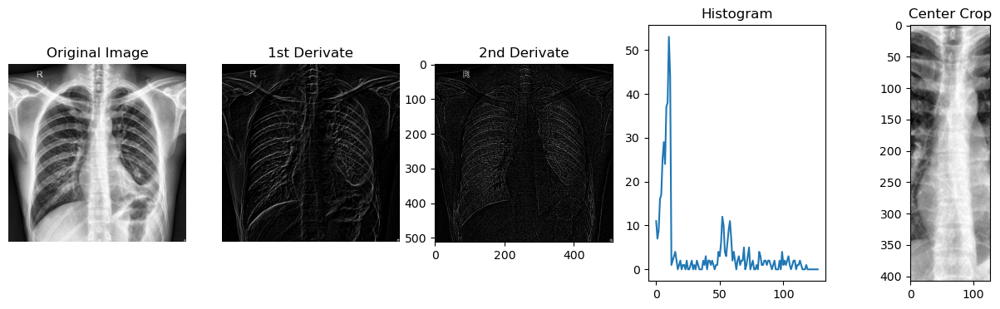

Original Description: {'mean': 137.51898193359375, 'std': 67.11253083547618, 'focus': 2108.9846}
Sobel Description: {'mean': 16.573749542236328, 'std': 22.072212324904463, 'focus': 9038.839}
Laplacian Description: {'mean': 15.69732666015625, 'std': 26.542811427867694, 'focus': 54012.27}
Crop Description:  {'mean': 171.69232536764707, 'std': 52.83774020582591, 'focus': 1549.8876}


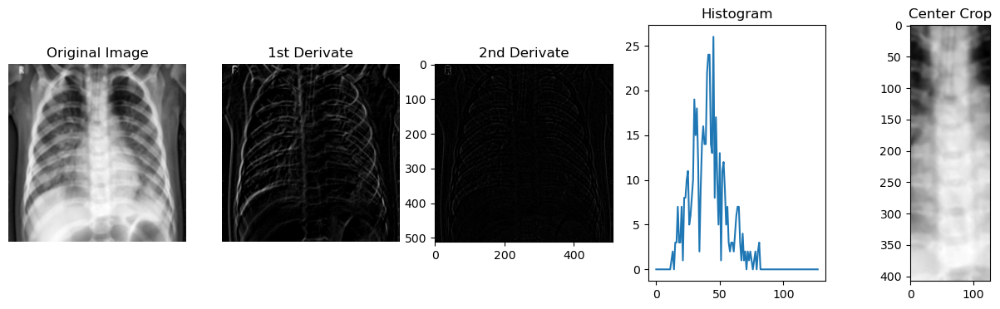

Original Description: {'mean': 135.6058349609375, 'std': 64.23828498269683, 'focus': 152.58548}
Sobel Description: {'mean': 9.208919525146484, 'std': 12.686050874136619, 'focus': 589.39685}
Laplacian Description: {'mean': 4.590187072753906, 'std': 7.445516877796504, 'focus': 4355.9824}
Crop Description:  {'mean': 180.5488089767157, 'std': 57.28777631386746, 'focus': 108.90042}


In [9]:
# SAMPLE_SIZE = 5

image_examples = np.random.choice(image_filenames, size=SAMPLE_SIZE, replace=False)

for i, img_name in enumerate(image_examples):
    img = read_image( img_name, size=(512, 512) )
    crop_img = middle_crop( img )
    
    # get stats
    img_stats = get_image_stats( img )
    crop_stats = get_image_stats( crop_img )
    
    # sobel and laplace images
    grad_x = cv2.Sobel(img, ddepth=-1, dx=1, dy=0, ksize=3 )
    grad_y = cv2.Sobel(img, ddepth=-1, dx=0, dy=1, ksize=3 )
    sobel = cv2.addWeighted(grad_x, 0.5, grad_y, 0.5, 0)
    laplacian = cv2.Laplacian( img, ksize=3, ddepth=-1 )
    
    # histogram of colors
    hist = get_histogram( img )
    
    fig, ax = plt.subplots(1, 5, figsize=(16, 4))
    
    ax[0].imshow( img, cmap='gray'), ax[0].axis('off')
    ax[0].set_title("Original Image")

    ax[1].imshow( sobel, cmap='gray'), ax[1].axis('off')
    ax[1].set_title("1st Derivate")
    
    ax[2].imshow( laplacian, cmap='gray'), ax[1].axis('off')
    ax[2].set_title("2nd Derivate")
    
    ax[3].plot( hist )
    ax[3].set_title("Histogram") 

    ax[4].imshow( crop_img, cmap='gray'), ax[1].axis('off')
    ax[4].set_title("Center Crop")
    plt.show()
    
    
    print("Original Description:", get_image_stats( img ) )
    print("Sobel Description:", get_image_stats( sobel ) )
    print("Laplacian Description:", get_image_stats( laplacian ) )
    print("Crop Description: ", crop_stats)
    print("=" * 100)

We got some ideas for the preprocessing:
- We identify **negatives** by computing `mean value` of crops ( should be lower )
- We identify **noisy images** by the _std_ of the 2nd derivate ( should higher ).
- We identify **blurred images** by the _focus_ measurement on the whole image ( should be lower ).

**Note:** After some analysis it's been checked that some noisy images could be categorised as "negative" using this methods, because of this it may be relevant to give some priority to the detections.

**Assumption:** Images only present one perturbation at the same time ( checked visually ).

### (2) Solutions:

We develop in the same order of perturbations priority:

- (1) Noisy images ( _note that the methods could yield blurred images_ ).
- (2) Blurred images.
- (3) Negative images.

**Note:** This is not the actual preprocessing, just trying to understand the problem. The actual solution will be in the `01_preprocessing.ipynb` notebook

#### 2.1 Noisy Images:

Now let's check how each problem can be solved:

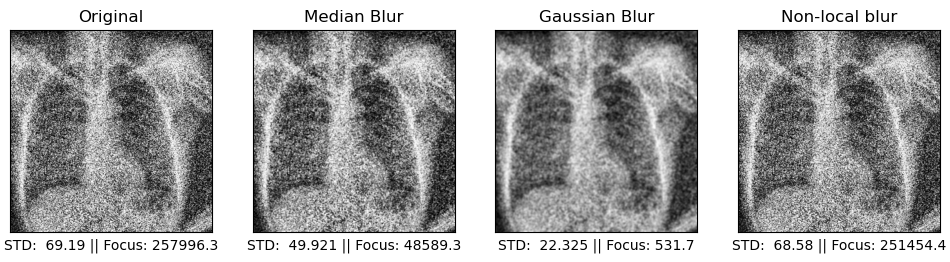

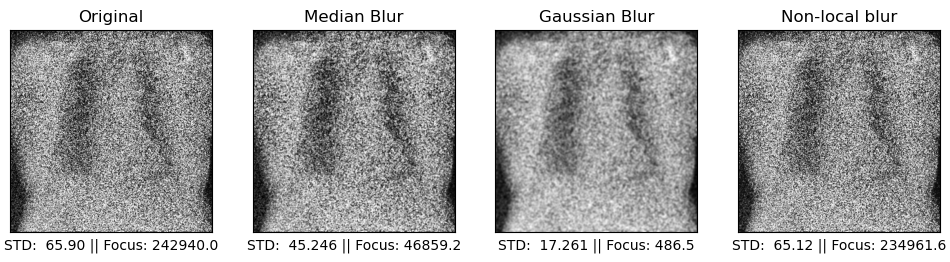

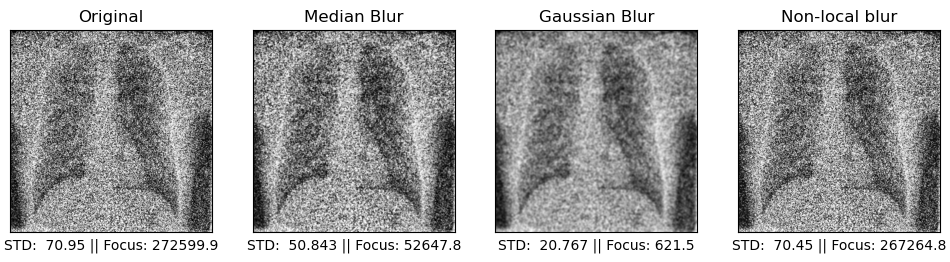

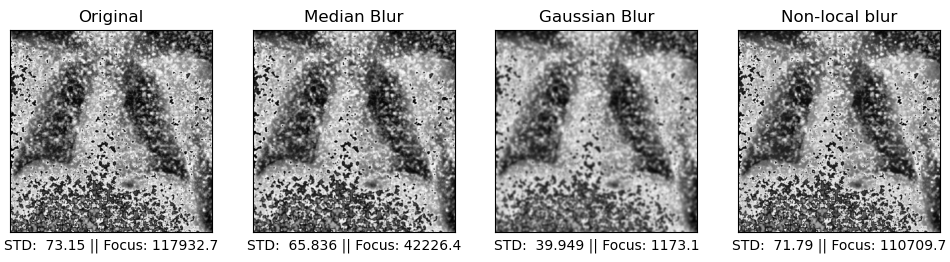

In [10]:
noisy_images = [ 'P00001_1.png', 'P00007_2.png', 'P00026_1.png', 'P00038_1.png' ]

for i, img_name in enumerate(noisy_images):
    img = read_image( img_name, size=(512, 512))
    
    fig, ax = plt.subplots(1, 4, figsize=(12, 6))
    ax[0].imshow(img, cmap='gray'), ax[0].set_yticks([]), ax[0].set_title("Original")

    # noisy removel
    gauss_img = cv2.GaussianBlur( img, (11,11), 0)
    median_img = cv2.medianBlur( img, 3 )
    nonloc_img = cv2.fastNlMeansDenoising( img, h=17, templateWindowSize=3)
    
    # we can calculate the std on the crop parts ( as before )
    img_stats = get_image_stats( bottom_center_crop( img ) )
    median_stats = get_image_stats( bottom_center_crop( median_img ) )
    gauss_stats = get_image_stats( bottom_center_crop( gauss_img ) )
    nonloc_stats = get_image_stats( bottom_center_crop( nonloc_img ) )
    
    ax[1].imshow( median_img, cmap='gray'), ax[1].set_yticks([]), ax[1].set_title('Median Blur')
    ax[2].imshow( gauss_img, cmap='gray'), ax[2].set_yticks([]), ax[2].set_title('Gaussian Blur')
    ax[3].imshow( nonloc_img, cmap='gray'), ax[3].set_yticks([]), ax[3].set_title('Non-local blur')
    
    ax[0].set_xticks([]), ax[0].set_xlabel(f"STD: {img_stats['std']: .2f} || Focus:{img_stats['focus']: .1f}")
    ax[1].set_xticks([]), ax[1].set_xlabel(f"STD: {median_stats['std']: .3f} || Focus:{median_stats['focus']: .1f}")
    ax[2].set_xticks([]), ax[2].set_xlabel(f"STD: {gauss_stats['std']: .3f} || Focus:{gauss_stats['focus']: .1f}")
    ax[3].set_xticks([]), ax[3].set_xlabel(f"STD: {nonloc_stats['std']: .2f} || Focus:{nonloc_stats['focus']: .1f}")

    plt.show()


We can see that for the noise removal techniques we will have to weight-in the decreased quality of the image. Ideally, we could tested this by using the same pipeline under different _noise removal techniques_.

#### 2.2 Enhacing blurred images

The idea here is to demonstrate ways to "sharpen" blurred images, we will try different techniques.

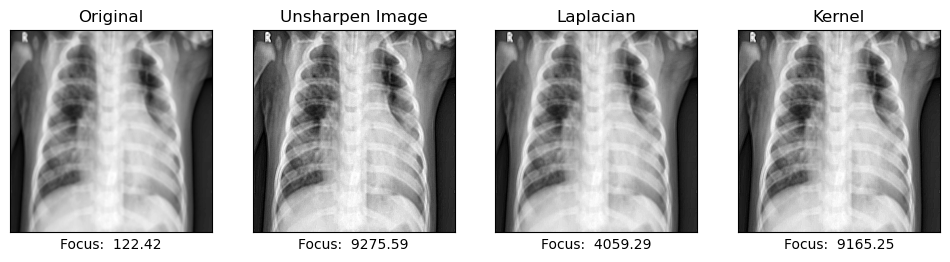

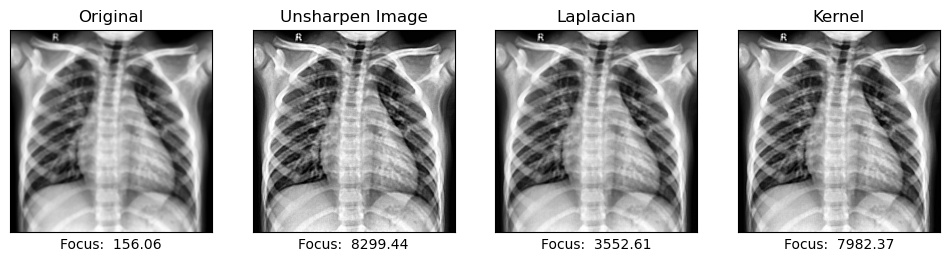

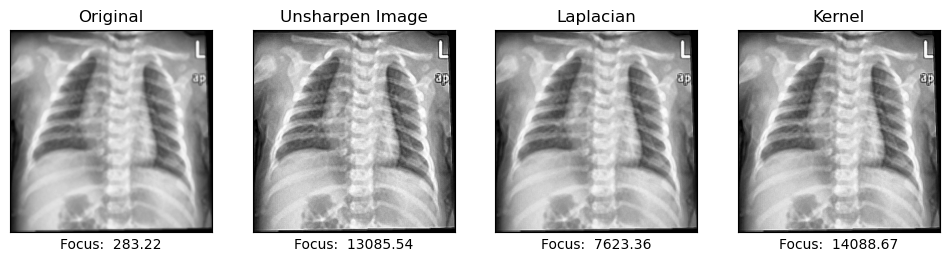

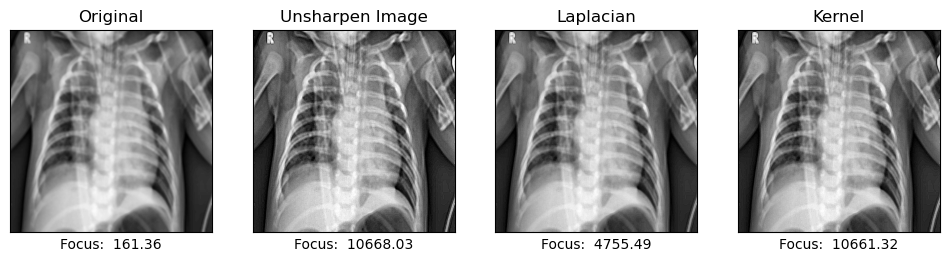

In [26]:
blurred_images = [ 'P00054_1.jpeg', 'P00050_2.jpeg', 'P00031_1.png', 'P00022_1.jpeg' ]

def kernel_sharpening( image ):
    kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    return cv2.filter2D(image, -1, kernel)

def laplacian_sharpening( image, kernel_size=3, factor=1):
    laplace_img = cv2.Laplacian(image, ddepth=cv2.CV_32F, ksize=kernel_size)
    laplace = np.clip( image - factor * laplace_img, a_min=0, a_max=255)
    return laplace

def unsharp_mask(image, kernel_size=(7, 7), sigma=1.0, factor=1, threshold=0):
    """Return a sharpened version of the image, using an unsharp mask."""
    blurred = cv2.GaussianBlur(image, kernel_size, sigma)
    sharpened = float(factor + 1) * image - float(factor) * blurred
    sharpened = np.maximum(sharpened, np.zeros(sharpened.shape))
    sharpened = np.minimum(sharpened, 255 * np.ones(sharpened.shape))
    sharpened = sharpened.round().astype(np.uint8)
    if threshold > 0:
        low_contrast_mask = np.absolute(image - blurred) < threshold
        np.copyto(sharpened, image, where=low_contrast_mask)
    return sharpened

for i, img_name in enumerate( blurred_images ):
    img = read_image( img_name, size=(512,512) )
                     
    fig, ax = plt.subplots(1, 4, figsize=(12, 3))
    ax[0].imshow(img, cmap='gray'), ax[0].set_yticks([]), ax[0].set_title("Original")

    # apply the preprocessing
    unsharpen_img = unsharp_mask( img, factor=10 )
    laplace_img = laplacian_sharpening( img, kernel_size=3, factor=0.5 )
    kernel_img = kernel_sharpening( img )

    ax[1].imshow( unsharpen_img, cmap='gray'), ax[1].set_yticks([]), ax[1].set_title('Unsharpen Image')
    ax[2].imshow( laplace_img, cmap='gray'), ax[2].set_yticks([]), ax[2].set_title('Laplacian')
    ax[3].imshow( kernel_img, cmap='gray'), ax[3].set_yticks([]), ax[3].set_title('Kernel')

    # we can calculate the std on the crop parts ( as before )
    img_stats = get_image_stats( img )
    unshaper_stats = get_image_stats( unsharpen_img )
    laplace_stats = get_image_stats( laplace_img )
    kernel_stats = get_image_stats( kernel_img )

    ax[0].set_xticks([]), ax[0].set_xlabel(f"Focus: {img_stats['focus']: .2f}")
    ax[1].set_xticks([]), ax[1].set_xlabel(f"Focus: {unshaper_stats['focus']: .2f}")
    ax[2].set_xticks([]), ax[2].set_xlabel(f"Focus: {laplace_stats['focus']: .2f}")
    ax[3].set_xticks([]), ax[3].set_xlabel(f"Focus: {kernel_stats['focus']: .2f}")
    plt.show()
    

We can check that most of the techniques improve vastly the image. Now we can check how they work when trying to improve the blurred **_image produced in the nosiy removal step_**:

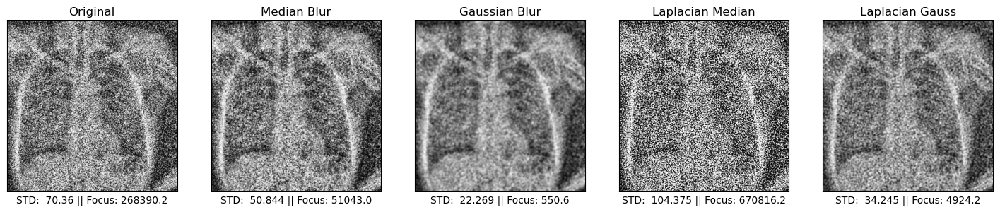

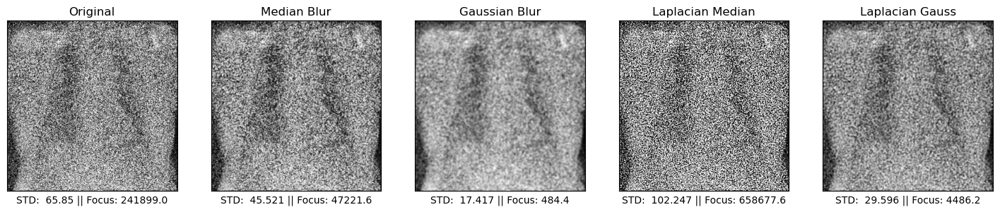

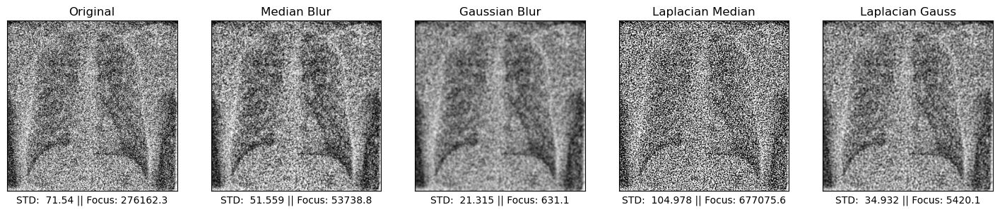

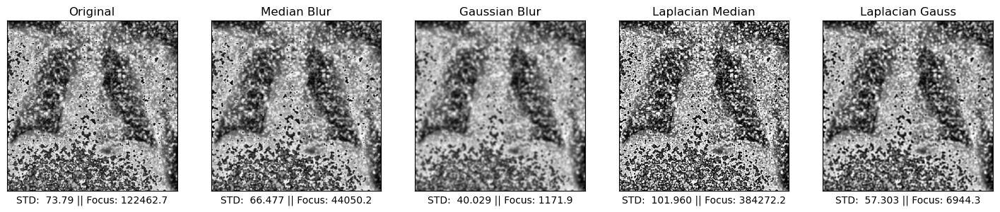

In [476]:
noisy_images = [ 'P00001_1.png', 'P00007_2.png', 'P00026_1.png', 'P00038_1.png' ]

for i, img_name in enumerate(noisy_images):
    img = read_image( img_name, size=(512, 512))
    
    fig, ax = plt.subplots(1, 5, figsize=(18, 6))
    ax[0].imshow(img, cmap='gray'), ax[0].set_yticks([]), ax[0].set_title("Original")

    # noisy removel
    gauss_img = cv2.GaussianBlur( img, (11,11), 0)
    median_img = cv2.medianBlur( img, 3 )
    
    laplace_gauss = laplacian_sharpening( gauss_img, kernel_size=3, factor=0.7 )
    laplace_median = laplacian_sharpening( median_img, kernel_size=3, factor=0.7 )
        
    # we can calculate the std on the crop parts ( as before )
    img_stats = get_image_stats( bottom_center_crop( img ) )
    median_stats = get_image_stats( bottom_center_crop( median_img ) )
    gauss_stats = get_image_stats( bottom_center_crop( gauss_img ) )
    lgaus_stats = get_image_stats( bottom_center_crop( laplace_gauss ) )
    lmedian_stats = get_image_stats( bottom_center_crop( laplace_median ) )
    
    
    ax[1].imshow( median_img, cmap='gray'), ax[1].set_yticks([]), ax[1].set_title('Median Blur')
    ax[2].imshow( gauss_img, cmap='gray'), ax[2].set_yticks([]), ax[2].set_title('Gaussian Blur')
    ax[3].imshow( laplace_median, cmap='gray'), ax[3].set_yticks([]), ax[3].set_title('Laplacian Median')
    ax[4].imshow( laplace_gauss, cmap='gray'), ax[4].set_yticks([]), ax[4].set_title('Laplacian Gauss')
    
    ax[0].set_xticks([]), ax[0].set_xlabel(f"STD: {img_stats['std']: .2f} || Focus:{img_stats['focus']: .1f}")
    ax[1].set_xticks([]), ax[1].set_xlabel(f"STD: {median_stats['std']: .3f} || Focus:{median_stats['focus']: .1f}")
    ax[2].set_xticks([]), ax[2].set_xlabel(f"STD: {gauss_stats['std']: .3f} || Focus:{gauss_stats['focus']: .1f}")
    ax[3].set_xticks([]), ax[3].set_xlabel(f"STD: {lmedian_stats['std']: .3f} || Focus:{lmedian_stats['focus']: .1f}")
    ax[4].set_xticks([]), ax[4].set_xlabel(f"STD: {lgaus_stats['std']: .3f} || Focus:{lgaus_stats['focus']: .1f}")

    plt.show()


We can see check that there is a trade-off, again, between the bluriness and how much noise we have. With the `Gausian Blur` + `Laplacian Sharpening` the results seem to be the best.

#### 2.3 Negative images:

Similarly as before, we can propose a pre-processing for the negative images. As we said before we can identify them by the _mean value_ of the pixels in the crop.

In [478]:
def invert_image( image ):
    """
    For the negative images we take a slightly different approach.
    - We compare the `mean` value between the original and inverted images
    - Keep the one with higher mean score.
    """
    inverted_img = cv2.bitwise_not( image )
    original_stats = get_image_stats( middle_crop( image ) )
    inverted_stats = get_image_stats( middle_crop( inverted_img ) )
    if ( inverted_stats['mean'] > original_stats['mean'] ):
        return True, inverted_img
    return False, image

Apply to random images:

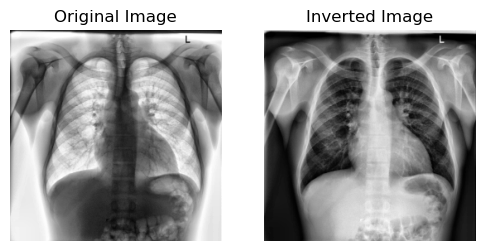

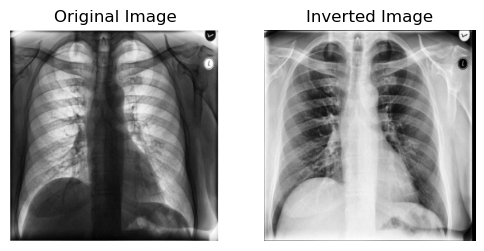

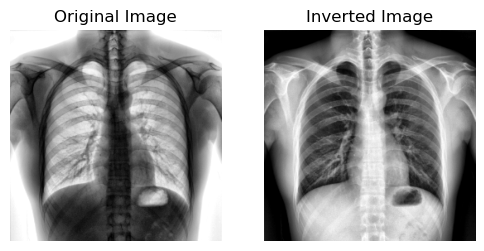

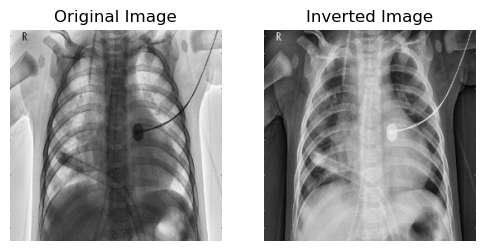

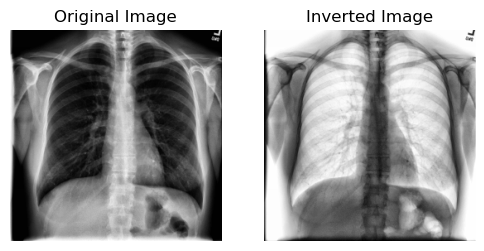

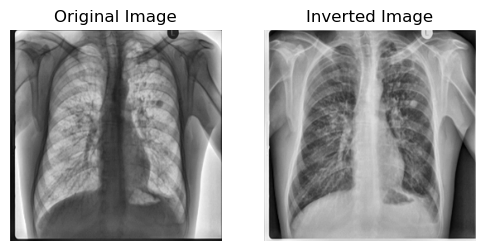

In [482]:
SAMPLE_SIZE = 5

np.random.shuffle(image_filenames)
example_counters = 0
for i, img_name in enumerate( image_filenames ):
    orig_img = read_image( img_name, size=(256, 256) )
    neg_flag, img = invert_image( orig_img )
    if neg_flag:
        example_counters += 1
        fig, ax = plt.subplots(1, 2, figsize=(6, 3))
        ax[0].imshow( orig_img, cmap='gray'), ax[0].axis('off'), ax[0].set_title('Original Image')
        ax[1].imshow( img, cmap='gray'), ax[1].axis('off'), ax[1].set_title('Inverted Image')
        plt.show()
    if ( example_counters > SAMPLE_SIZE ):
        break


We can see that there are some problems with the _detection_ of the inverse image. We could try to use more than one crop and do something like _majority voting_.

#### 2.4 Extra Problem: framed images

Here we discussed an extra problem that arised from visual inspection of our data: some images are framed!

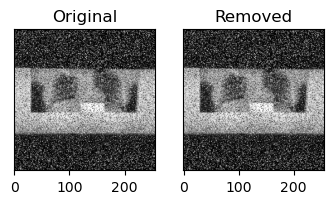

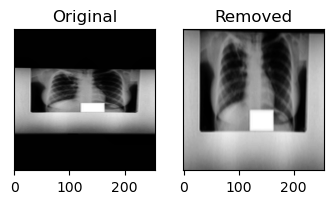

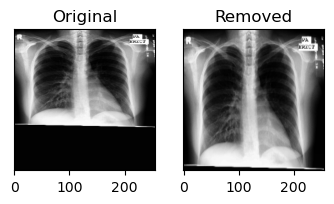

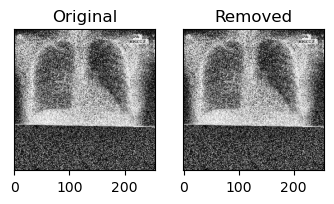

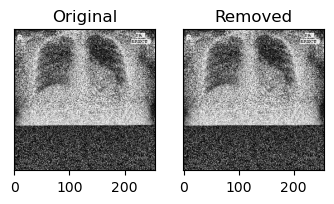

...

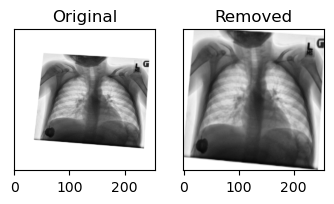

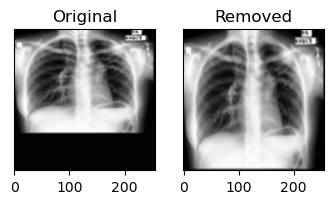

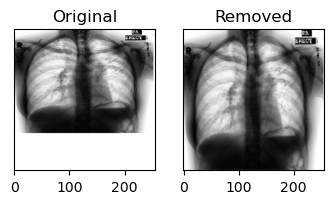

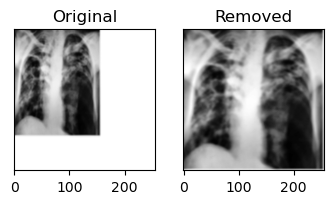

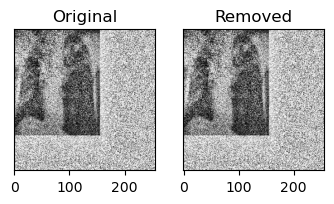

In [67]:
framed_examples = [
    'P01439_1.png', 'P01439_2.png', 'P01627_2.png', 'P01627_1.png', 'P01738_1.png', 'P01738_2.png',
    'P02001_1.png', 'P02196_1.png', 'P02196_2.png', 'P02691_1.png', 'P02691_2.png'
]

def delete_image_borders( image, std_thresh=10):
    """ The idea is simple, check rows and cols that are all 0 or 255"""
    
    # we calculate the std on the rows and on the columns
    row_std = np.std(image, axis=1)
    col_std = np.std(image, axis=0)
    
    # real rows/cols
    significant_rows = np.where(row_std > std_thresh)[0]
    significant_cols = np.where(col_std > std_thresh)[0]

    # final rectangle to return
    i = significant_rows[0] if significant_rows.size > 0 else image.shape[0]
    j = significant_rows[-1] + 1 if significant_rows.size > 0 else -1
    x = significant_cols[0] if significant_cols.size > 0 else image.shape[1]
    y = significant_cols[-1] + 1 if significant_cols.size > 0 else -1
    return image[ i:j, x:y]

for i, img_name in enumerate(framed_examples):
    img = read_image( img_name, size=(256, 256))
    img = cv2.max
    original_shape = img.shape
    border_removed = delete_image_borders( img )
    while ( border_removed.shape != original_shape ) :
        original_shape = border_removed.shape
        border_removed = delete_image_borders( border_removed )
    border_removed = cv2.resize( border_removed, dsize=img.shape )
    
    fig, ax = plt.subplots(1, 2, figsize=(4, 2))
    ax[0].imshow(img, cmap='gray'), ax[0].set_yticks([]), ax[0].set_title("Original")
    ax[1].imshow(border_removed, cmap='gray'), ax[1].set_yticks([]), ax[1].set_title("Removed")
    plt.show()

We can see that there are some problem on the images with noise, but it is still a good measurement in most of the cases.

## 1.2 Subproblem: Image similarity

Another \*probable\* problem we need to analyse is the presence of similar or, potentially, replicated images. This can happen at two levels:

1) A perturbation is performed on the normal image and both, the perturbed and normal images, are in the dataset.
2) Two different labelled patients have the same images ( this is a bigger problem, wrongly labelled patients ).

**Idea:** here we explore different ways to measure this similarity between images.

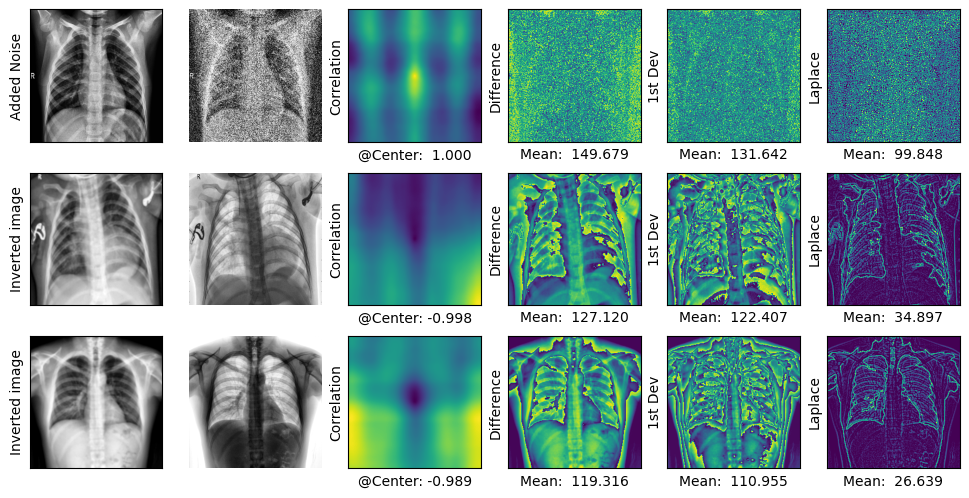

In [637]:
similar_images_pairs = [
    ('P00463_1.jpeg', 'P00463_2.jpeg', 'Added Noise'),
    ('P00837_1.jpeg', 'P00837_2.jpeg', 'Inverted image'),
    ('P00480_1.png', 'P00480_2.png', 'Inverted image'),   
]

def image_correlation( img0, img1 ):
    img0_norm = cv2.normalize( img0, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    img1_norm = cv2.normalize( img1, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    corr = cv2.filter2D( img0_norm, ddepth=-1, kernel=img1_norm )
    return cv2.normalize( corr, dst=None, alpha=-1, beta=1, norm_type=cv2.NORM_MINMAX)

def basic_diff( img0, img1 ):
    diff = cv2.normalize( img0 - img1, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX )
    return diff

def first_dev_diff( img0, img1 ):
    diff_img = basic_diff( img0, img1 )

    grad_x = cv2.Sobel(diff_img, ddepth=-1, dx=1, dy=0, ksize=3 )
    grad_y = cv2.Sobel(diff_img, ddepth=-1, dx=0, dy=1, ksize=3 )
    sobel = np.clip( (diff_img + diff_img) // 2, a_min=0, a_max=255 )
    return cv2.normalize( sobel, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    
def laplacian_diff( img0, img1, ksize=3):
    diff_img = basic_diff( img0, img1 )
    laplace = np.clip( cv2.Laplacian(diff_img, ksize=ksize, ddepth=-1), a_min=0, a_max=255 )
    return cv2.normalize( laplace, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)

samples_to_show = len(similar_images_pairs)
fig, ax = plt.subplots(samples_to_show, 6, figsize=(12, 2 * samples_to_show))
for i, (img0_name, img1_name, desc) in enumerate(similar_images_pairs):
    
    # load the images
    img0 = read_image( img0_name )
    img1 = read_image( img1_name )
    
    # we can measure the similariy with correlation
    corr_img = image_correlation( img0, img1 )
    diff_img = basic_diff( img0, img1 )
    first_dev_img = first_dev_diff( img0, img1 )
    laplacian_diff_img = laplacian_diff( img0, img1 )

    ax[i, 0].imshow( img0, cmap='gray'), ax[i, 0].set_xticks([]), ax[i, 0].set_yticks([])
    ax[i, 1].imshow( img1, cmap='gray'), ax[i, 1].axis('off')
    ax[i, 0].set_ylabel(desc)
    
    ax[i,2].imshow(corr_img), ax[i,2].set_xticks([]), ax[i,2].set_yticks([]), ax[i,2].set_ylabel('Correlation')
    ax[i,3].imshow(diff_img), ax[i,3].set_xticks([]), ax[i,3].set_yticks([]), ax[i,3].set_ylabel('Difference')
    ax[i,4].imshow(first_dev_img), ax[i,4].set_xticks([]), ax[i,4].set_yticks([]), ax[i, 4].set_ylabel('1st Dev')
    ax[i,5].imshow(laplacian_diff_img), ax[i,5].set_xticks([]), ax[i,5].set_yticks([]), ax[i, 5].set_ylabel('Laplace')
    
    # write stats
    ax[i, 2].set_xlabel(f'@Center: { corr_img[ corr_img.shape[0] // 2, corr_img.shape[1] // 2]: .3f}')
    ax[i, 3].set_xlabel(f'Mean: { diff_img.mean() : .3f}')
    ax[i, 4].set_xlabel(f'Mean: { first_dev_img.mean() : .3f}')
    ax[i, 5].set_xlabel(f'Mean: { laplacian_diff_img.mean(): .3f}')
    
    
plt.show()

From this measurements we can see that the `@center` statistic on the correlation image seem to be the most accurate to check if two images are the same. We can take the absoluto value in case of negatives.

**Note:** we have to check if this measurement is strong against not-similar images ( the value should be close to 0 ). This is importan to problem (2), it will be addresses later on this notebook.

# 2. Labels and Patients

Now we analyse the `.csv` file that presents all the info about the image corresponding the three classes. Here we can count the number of classes, set the number of patients and also check distributions.

In [5]:
labels_file = pd.read_csv( os.path.join(BASE_DATA_DIR, 'labels_train.csv'))
labels_file.head()

,file,label
0,P00001_1.png,N
1,P00001_2.png,N
2,P00002_1.png,N
3,P00003_1.png,N
4,P00004_1.jpeg,N


From the next cell we see one of the biggest problems to tackle: **the imbalance** of the classes. In this case `tuberculosis` is the class with less samples and, as such, we may have problem for generalisation over this label.

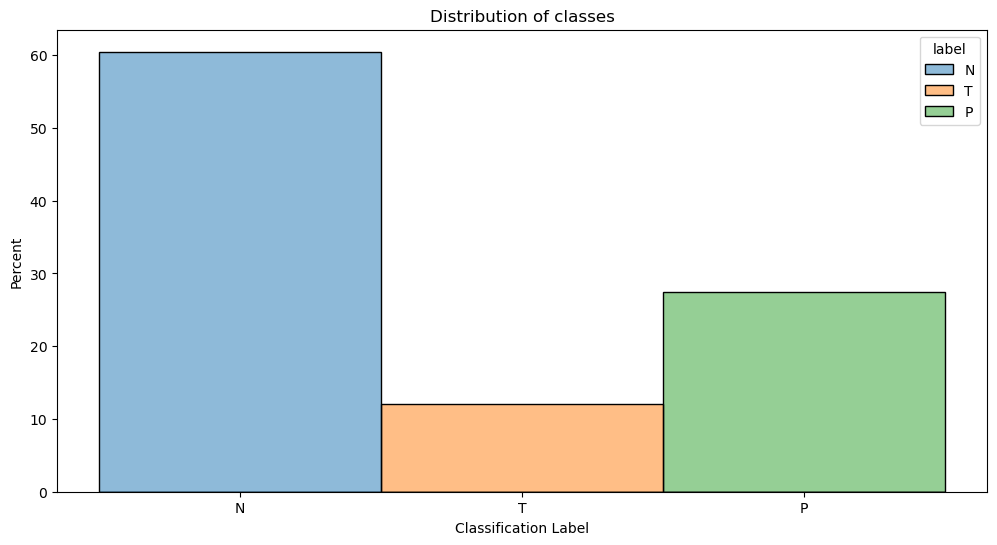

In [6]:
plt.figure(figsize=(12, 6))
plt.title("Distribution of classes")
sns.histplot( data=labels_file, x='label', hue='label', stat='percent')
plt.xlabel('Classification Label')
plt.show()

Now we can also try to understand how the patients are distributed. We get the _patient tag_ from the filename, then we get a similar plot than before.

We can note the distribution is pretty much the same, so there is no over-replication of the normal patients.

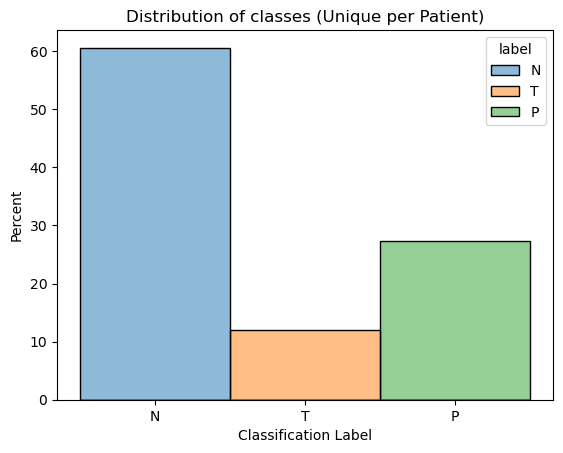

In [7]:
labels_file['tag'] = labels_file['file'].str.split('_').str[0]

plt.title("Distribution of classes (Unique per Patient)")
sns.histplot( data=labels_file.drop_duplicates(subset=['tag']), x='label', hue='label', stat='percent') 
plt.xlabel('Classification Label')
plt.show()

From the following we check that all patients either have one image or maximum two:

In [9]:
print("Number of unique patients:", labels_file['tag'].nunique() )
labels_file.groupby('tag').agg({'file': 'count'})['file'].value_counts()

Number of unique patients: 12086


1    8702
2    3384
Name: file, dtype: int64

Now, let's take random patients and check the available images. _We will also try to check how different are the images for the same patient._ We will use the **correlation@center** discussed before, but we will also include other measurements (with similar ideas).

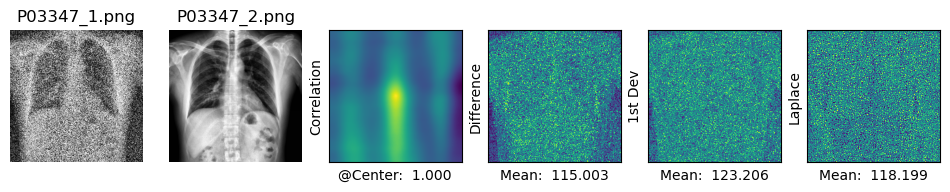

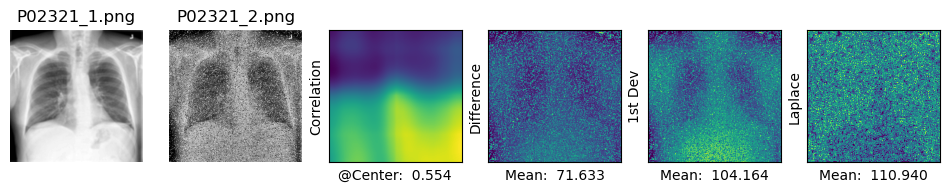

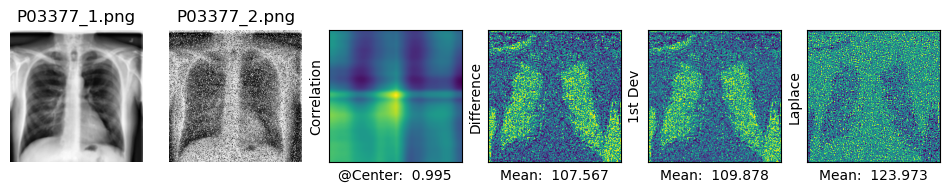

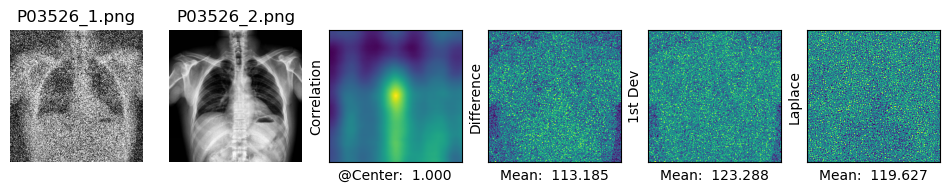

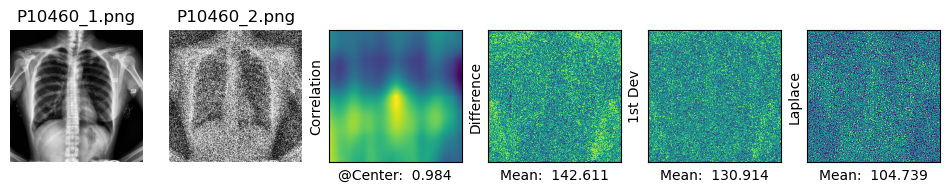

In [639]:
patients_multiple_imgs = labels_file[ labels_file['tag'].duplicated( keep=False ) ]

# random patients
SAMPLE_SIZE = 5
patients_sample = np.random.choice( patients_multiple_imgs['tag'].unique(), size=SAMPLE_SIZE, replace=False )

# here we show both images along with the correlation 
for i, pid in enumerate( patients_sample ):
    fig, ax = plt.subplots( 1, 6, figsize=(12, 2))
    imgs_names = patients_multiple_imgs[ patients_multiple_imgs['tag'] == pid ]['file'].values
    
    imgs = []
    for j, img_name in enumerate(imgs_names):
        img = read_image( img_name, size=(256, 256) )
        imgs.append( img )
        
        ax[j].imshow( img, cmap='gray'), ax[j].axis('off')
        ax[j].set_title( img_name )
    
    
    # we can measure the similariy with correlation
    corr_img = image_correlation( imgs[0], imgs[1] )
    diff_img = basic_diff( imgs[0], imgs[1] )
    first_dev_img = first_dev_diff( imgs[0], imgs[1] )
    laplacian_diff_img = laplacian_diff( imgs[0], imgs[1] )
    
    # show images
    ax[2].imshow(corr_img), ax[2].set_xticks([]), ax[2].set_yticks([]), ax[2].set_ylabel('Correlation')
    ax[3].imshow(diff_img), ax[3].set_xticks([]), ax[3].set_yticks([]), ax[3].set_ylabel('Difference')
    ax[4].imshow(first_dev_img), ax[4].set_xticks([]), ax[4].set_yticks([]), ax[4].set_ylabel('1st Dev')
    ax[5].imshow(laplacian_diff_img), ax[5].set_xticks([]), ax[5].set_yticks([]), ax[5].set_ylabel('Laplace')
    
    # write stats
    ax[2].set_xlabel(f'@Center: { corr_img[ corr_img.shape[0] // 2, corr_img.shape[1] // 2]: .3f}')
    ax[3].set_xlabel(f'Mean: { diff_img.mean() : .3f}')
    ax[4].set_xlabel(f'Mean: { first_dev_img.mean() : .3f}')
    ax[5].set_xlabel(f'Mean: { laplacian_diff_img.mean(): .3f}')

    plt.show()

Even if from the previous idea we can't really find a exact method to determine if two images have the same "base", from the visual inspection done ( after running this cell with several samples ) we can see that all the images align with this idea.

**Note:** This is a relevant result, it can be useful to know when doing the preprocessing and split between train and test.

Now, we are still exposed to (2) - the problem of same image on different patients -. For this we will take a different _assumption_, we will assume that if this happens it wil be a repetition of the same image and not a perturbation. Because of this, **we can just check if we have the exam same image among different patients.**

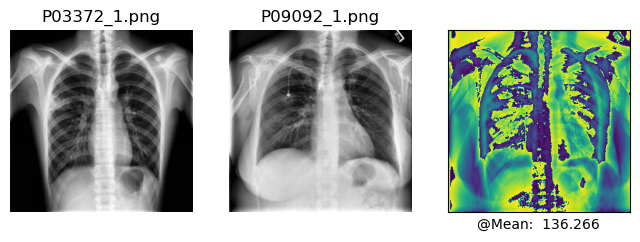

In [678]:
samples_to_show = np.random.choice(labels_file.drop_duplicates( subset=['tag'])['file'], size=2)

# here we show both images along with the correlation 
fig, ax = plt.subplots( 1, 3, figsize=(8, 16))

imgs = []
for i, img_name in enumerate(samples_to_show):
    img = read_image( img_name, size=(256, 256) )
    imgs.append( img )
        
    ax[i].imshow( img, cmap='gray'), ax[i].axis('off')
    ax[i].set_title( img_name )

# calculate correlation
diff_image = np.abs( imgs[0] - imgs[1] )

ax[2].imshow( diff_image ), ax[2].set_xticks([]), ax[2].set_yticks([])
ax[2].set_xlabel(f'@Mean: { diff_image.mean(): .3f}')
plt.show()

The next noteook `01_preprocessing` will handle the split and preprocessing pipeline for both datasets.